# EDA and pre-pre-processing

#### Data: 
latest listings.csv for the city of Amsterdam

#### Goal: 
come up with a framework for automatic the repetitive data munging scenario so that I can quickly apply it to as many citie as possible. 

#### Issues: 
altough it is, of course, best to study each and every dataset on its own and make some more calculated decisions, such a task is very, very time consuming and I need to fetch as much data as possible. So hopefully that will even out.

## Libraries

Obs: The modules for data visualizations are separate, below.

In [2]:
#
import warnings
import pandas as pd 
import numpy as np
import os 
from datetime import datetime as dt
import seaborn as sns
sns.set()

# Print inline
%matplotlib inline
warnings.filterwarnings("ignore")

## Fetch the data

In [316]:
#
root = r"C:\Users\aleen\Desktop\Master Thesis\Data\amsterdam\listings"
os.chdir(root)
df = pd.read_csv(root + "\listings.csv")

# 1) Function scope

In order to speed up the process and enable scaling and reproductibility of the process, I've created a collection of functions which are each useful in their own right. Some are very general and applicable to other datasets, others are just specifically tailored to tackle the issues at hand.

### EDA

In [120]:
######################################################################################################
def pandas_display_options(rows, columns, width):
    '''
    This function is suited for EDA. It allows you to display samples of big dataframes in iPython.
    '''
    pd.set_option('display.max_rows', rows)
    pd.set_option('display.max_columns', columns) # So we can display all columns
    pd.set_option('display.width', width)
    
######################################################################################################
def dtype_groups(df):
    '''
    A very elegant way of displaying the features, grouped by their data types.
    '''
    return (df.columns.to_series().groupby(df.dtypes).groups)

######################################################################################################
def amenities_counter(amenities):
    '''
    Counts the number of amenities. I don't think they're that great.
    To run this function, try: df["amenities_counter"] = df.amenities.map(amenities_counter)
    '''
    return len(amenities.split(","))

######################################################################################################
def top_ammenities(df, top =None, plot = False):
    '''
    This function takes apart that horrible looking dictionary and returns for us the x most common/uncommon ammenities.
    It can also plot them if you like.
    '''
    from collections import Counter
    results = Counter()
    df['amenities'].str.strip('{}')\
                   .str.replace('"', '')\
                   .str.lstrip('\"')\
                   .str.rstrip('\"')\
                   .str.split(',')\
                   .apply(results.update)
    
    if plot == True:
        import matplotlib.pyplot as plt
        # create a new dataframe
        sub_df0 = pd.DataFrame(results.most_common(top), columns=['amenity', 'count'])
        # plot the Top 
        sub_df0.sort_values(by=['count'], ascending=True).plot(kind='barh', x='amenity', y='count',  
                                                      figsize=(10,7), legend=False, color='darkgrey',
                                                      title='Amenities')
        plt.xlabel('Count');
        

    return(results.most_common(top))

######################################################################################################
def get_nulls(df):
    '''
    This function prints out the columns which have or do not have null values and the sum of nulls.
    Then, if present, it finally prints out only the names of the columns which are problematic. 
    
    Input: A data frame. 
    
    '''
    columns = df.columns
    
    # Print which columns have nulls or not. 
    print('\033[1m')
    print("Information about which columns have nulls or not:")
    print('\033[0m')
    print(df.isna().any())
    
    # How many nulls in each column?
    print('\033[1m')
    print("How many null values does each variable hold?")
    print('\033[0m')
    print(df.isna().sum())
    
    # List to store result 
    problem_columns = []
    
    # Names of columns with problems. 
    for i in range (0, len(df.isna().sum())):
        if df.isna().sum()[i] == 0:
            problem_columns.append(columns[i])
    if not problem_columns:
        print('\033[1m\nThere are no variables affected by null values.\033[0m')
    else:
        print('\033[1m\nThese are the column names of the variables which present problems:\033[0m')
        print(problem_columns)
    

### Munging

In [324]:
######################################################################################################

''' MISCELANEOUS '''

######################################################################################################
def convert_to_euro(amount,currency):
    '''
    This converter uses no API at the moment. Just need to update the currency rate list.
    You input the amount of currency you want to convert and the currency you convert to.
    '''
    rates = [(0.13,"DKK"),(1.20,"GBP"),(1.0,"EUR")]
    
    def getall(my_list, s):
        index = [x for x, y in my_list if y==s] # Very versatile. 
        return (index[0])
    
    rate = getall(rates, currency)
    out = amount * rate
    return (out)

######################################################################################################
def text_word_len(text):
    '''
    Returns the length of a text (in number of words used).
    This could ascribe some quantifiable value to strings.
    '''
    return(len(text.split(" ")))

######################################################################################################
def amenities_list_counter(amenities):
    '''
    Returns the length of an amenities group list.
    '''
    return len(amenities)

######################################################################################################

''' DATA TYPE CONVERSION '''

######################################################################################################
def listings_to_datetime(df, feature):
    df[feature] = pd.to_datetime(df[feature])
    
######################################################################################################
def listings_to_float(df, feature):
    df[feature] = df[feature].astype(float)

######################################################################################################
def price_to_float(df, feature):
    '''
    This function deletes dollar signs from prices and then converts the remaining string to float.
    '''
    df[feature] = df[feature].replace('[\$,]', '', regex=True).astype(float)
    df[feature] = pd.to_numeric(df[feature])

######################################################################################################
def percent_string_to_number(df, feature):
    '''
    Replaces the string % and then converts the number to a percentage between 0 and 1.
    Here, it's host response rate.
    '''
    df[feature] = df[feature].str.replace('%', '').astype(float)
    df[feature] = df[feature] / 100
    
######################################################################################################
def memory_optimization(df, feature):
    '''
    Transforming features to category instead of obsects saves up a lot of physical memory space.
    '''
    df[feature] = df[feature].astype('category')

######################################################################################################

''' NANS, OUTLIERS AND DUPLICATES'''

######################################################################################################
def fill_nans(df,feature,filling="mean"):
    '''
    Fills Nans by replacing them with either median, mean, or a value chosen by the user.
    Default filling value is mean.
    '''
    if filling == "median":
        median = df[feature].median()
        df[feature] = df[feature].fillna(median)
    elif filling == "mean":
        mean = df[feature].mean()
        df[feature] = df[feature].fillna(mean)
    else:
        df[feature].fillna(filling, inplace=True)

######################################################################################################
def remove_outliers(df,feature, bound = "both", method="iqr"):
    '''
    This function removes outliers in a versatile way, according to needs and preferences.
    The method is either Interquartilic Range, Z-Scores or just deleting the dop and bottom 1% values.
    Furthermore, you can specify if you want to remove the lower or upper bound outliers. Or both.
    '''
    if method == "iqr":
        q1 = df[feature].quantile(0.25)
        q3 = df[feature].quantile(0.75)
        iqr = q3-q1
        lower_bound = q1 - (1.5*iqr)
        upper_bound = q3 + (1.5*iqr)
        
        if bound == "both":
            df.drop(df[ (df[feature] > upper_bound) & (df[feature]) < lower_bound].index, axis=0, inplace=True)
        elif bound == "lower":
            df.drop(df[ df[feature] < lower_bound ].index, axis=0, inplace=True)
        elif bound == "upper":
            df.drop(df[ df[feature] > upper_bound ].index, axis=0, inplace=True)
        
    elif method == "zscore":
        from scipy import stats
        df.drop(df[ np.abs(stats.zscore(df[feature]) < 3)], axis=0, inplace=True)
                
    elif method == "1%":
        qhigh = df[feature].quantile(0.99)
        qlow = df[feature].quantile(0.01)
        
        if bound == "both":
            df.drop(df[ (df[feature] > qhigh) & (df[feature] < qlow) ].index, axis=0, inplace=True)
        elif bound == "lower":
            df.drop(df[ df[feature] < qlow ].index, axis=0, inplace=True)
        elif bound == "upper":
            df.drop(df[ df[feature] > qhigh ].index, axis=0, inplace=True)

######################################################################################################
def delete_rows_conditional(df, condition1, threshold1, feature1,
                condition2 = None, threshold2 = None, feature2 = None, 
                logical_operator = None):
    '''
    
    This function deletes rows based on certain features, conditions and thresholds. 
    The features and conditions are not unique and can repeat themselves.
    The logical operator parameter dictates the relationship between the two conditions.
    
    The following parameters can take only the following values:
        - condition = ['greater_than', 'lesser_than', 'equal_to', 'not_equal_to']
        - logical_operator = ['and', 'or']
    
    '''
    ########### 1) ONE CONDITION CASE ##########
    if condition2 == None:
    
        if condition1 == 'greater_than':
            df.drop(df[ (df[feature1] > threshold1) ].index, axis=0, inplace=True)

        elif condition1 == 'lesser_than':
            df.drop(df[ (df[feature1] < threshold1) ].index, axis=0, inplace=True)

        elif condition1 == 'equal_to':
            df.drop(df[ (df[feature1] == threshold1) ].index, axis=0, inplace=True)

        elif condition1 == 'not_equal_to':
            df.drop(df[ (df[feature1] != threshold1) ].index, axis=0, inplace=True)
        
        
    ########### 2) TWO CONDITIONS CASE ##########
    
    #################################################################################################################
    elif condition1 == 'greater_than' and condition2 == 'greater_than' and condition3 == None:
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] > threshold1) and (df[feature2] > threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] > threshold1) | (df[feature2] > threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'greater_than' and condition2 == 'lesser_than' and condition3 == None:
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] > threshold1) and (df[feature2] < threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] > threshold1) | (df[feature2] < threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'lesser_than' and condition2 == 'greater_than' and condition3 == None:
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] < threshold1) and (df[feature2] > threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] < threshold1) | (df[feature2] > threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'lesser_than' and condition2 == 'lesser_than':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] < threshold1) and (df[feature2] < threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] < threshold1) | (df[feature2] < threshold2) ].index, axis=0, inplace=True)
            
    #################################################################################################################        
            
    elif condition1 == 'equal_to' and condition2 == 'equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] == threshold1) and (df[feature2] == threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] == threshold1) | (df[feature2] == threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'not_equal_to' and condition2 == 'not_equal_to':
        
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] != threshold1) and (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] != threshold1) | (df[feature2] != threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'equal_to' and condition2 == 'not_equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] == threshold1) and (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] == threshold1) | (df[feature2] != threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'not_equal_to' and condition2 == 'equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] != threshold1) and (df[feature2] == threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] != threshold1) | (df[feature2] == threshold2) ].index, axis=0, inplace=True)
            
    #################################################################################################################
    
    elif condition1 == 'greater_than' and condition2 == 'equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] != threshold1) and (df[feature2] == threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] != threshold1) | (df[feature2] == threshold2) ].index, axis=0, inplace=True)
            
    elif condition1 == 'greater_than' and condition2 == 'not_equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] > threshold1) and (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] > threshold1) | (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        
    elif condition1 == 'equal_to' and condition2 == 'greater_than':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] == threshold1) and (df[feature2] > threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] == threshold1) | (df[feature2] > threshold2) ].index, axis=0, inplace=True)
        
    elif condition1 == 'not_equal_to' and condition2 == 'greater_than':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] != threshold1) and (df[feature2] > threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] != threshold1) | (df[feature2] > threshold2) ].index, axis=0, inplace=True)
    
    elif condition1 == 'lesser_than' and condition2 == 'equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] < threshold1) and (df[feature2] == threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] < threshold1) | (df[feature2] == threshold2) ].index, axis=0, inplace=True)
        
    elif condition1 == 'lesser_than' and condition2 == 'not_equal_to':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] < threshold1) and (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] < threshold1) | (df[feature2] != threshold2) ].index, axis=0, inplace=True)
        
    elif condition1 == 'equal_to' and condition2 == 'lesser_than':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] == threshold1) and (df[feature2] < threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] == threshold1) | (df[feature2] < threshold2) ].index, axis=0, inplace=True)
        
    elif condition1 == 'not_equal_to' and condition2 == 'lesser_than':
        if logical_operator == 'and':
            df.drop(df[ (df[feature1] != threshold1) and (df[feature2] < threshold2) ].index, axis=0, inplace=True)
        elif logical_operator == 'or':
            df.drop(df[ (df[feature1] != threshold1) | (df[feature2] < threshold2) ].index, axis=0, inplace=True)
    
    else:
        print("Exception: An error has occured. Please refer to the function's docstring and make sure you specify the parameters correctly.")
        
        
######################################################################################################

''' FEATURE ENCODING '''

######################################################################################################
def make_dummy(df, feature):
    dummy = pd.get_dummies(df[feature])
    return(dummy)
    # Join the encoded dummy
    #df = df.join(dummy)
    # Drop the initial series
    #df.drop(feature, axis=1,inplace=True)

######################################################################################################
def encode_label(df, feature):
    '''
    Just the Sklearn LabelEncoder but made easier to implement.
    Obs: It's usually preferable to just one-hot encode the data. 
    Label encoding makes the machine think the numbers have some kind of ordinal meaning.
    '''
    from sklearn.preprocessing import LabelEncoder
    labelencoder = LabelEncoder()
    df[feature] = labelencoder.fit_transform(df[feature])

######################################################################################################
def map_feature(df, feature):
    '''
    Just encodes f(false) as 0 and t(true) as 1. 
    '''
    df[feature] = df[feature].map({"f": 0, "t": 1})
    
######################################################################################################

''' NORMALIZATION '''

######################################################################################################
def normalize_price(df,feature,method="standard score"):
    '''
    In statistics, the standard score is the signed fractional number of standard 
    deviations by which the value of an observation or data point is above or below 
    the mean value of what is being observed or measured.
    '''
    # This should get rid of the need to convert currency.
    # And, most importantly, we can now concatenate different listings DF for different cities and even times.
    if method == "standard score":
        df[feature] = (df[feature] - df[feature].mean())/df[feature].std()
        normalized_df=(df-df.mean())/df.std()
        
######################################################################################################

''' FEATURE DELETION '''

######################################################################################################
def drop_or_keep_feature(df, threshold, print_option = False):
    ''' 
    This function deletes features that contain more than x% missing values. 
    Or rather, it returns a tuple containing the names of features to keep and features to drop.
    It also prints them out, if desired. Default is false.
    Threshold example: 30% is 0.3.
    '''
    cols = df.columns.values # Names of features
    lenght = df.shape[0] 
    # Initialize lists
    keep_list = [] 
    drop_list = []
    
    for i in cols:
        x = df[i]
        rate = round(x.isna().sum()/lenght,3)
        if rate < threshold:
            keep_list.append(i)
            if print_option == True:
                print(i,"contain :%",100*rate ,"KEEP.")
        else:
            drop_list.append(i)
            if print_option == True:
                print(i,"contain :%",rate*100 ,"DROP !!!")
            
    return(keep_list, drop_list)

######################################################################################################

''' FEATURE ENGINEERING '''

######################################################################################################
def city_center(city=df["city"].iloc[0]):
    from geopy import Nominatim
    locator = Nominatim(user_agent="aleen_prd")
    location = locator.geocode(city, timeout=5)
    center = (location.latitude, location.longitude)
    return(center)

######################################################################################################
def distance_to_center(acc_lat, acc_lon, center):
    '''
    Uses an API to calculate the distance in km to the city center of an Airbnb location.
    '''
    from geopy.distance import great_circle
    accommodation = (acc_lat, acc_lon)
    distance = great_circle(center, accommodation).km
    return (distance)
    
######################################################################################################
def host_age(df, present_year):
    df['host_age'] = (present_year - df['host_since'].dt.year)

######################################################################################################
def assign_property_type_group():
    groups_list = ["apartment","house","secondary","unique","b&b","hotel","ambiguous"]
    groups_lis_list = [apartmentL,houseL,secondaryL,uniqueL,bedbreakfastL,hotelL,ambiguousL]
    
    for g in range(len(groups_list)):
        df.loc[df['property_type'].isin(groups_lis_list[g]), 'property_type_groups'] = groups_list[g]
    

### Data visualizations

In [13]:
#####################################################################################################
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

#####################################################################################################
def plotly_text(fig, var1, var2 = None):
    '''
    This function is a helper function.
    It configures the axis and titles for plotly graphs.
    It was neccessary because the process is tedious and has many lines of code.
    '''
    if var2 == None:
        fig.update_layout(
            
        yaxis=go.layout.YAxis(
            title=go.layout.yaxis.Title(
                text=var1,
                font=dict(
                    family="Courier New, monospace",
                    size=18,
                    color="#7f7f7f"
                    )
                )
            )
        )
        
    else: 
        fig.update_layout(
                        
                        xaxis=go.layout.XAxis(
                            title=go.layout.xaxis.Title(
                                text=var2,
                                font=dict(
                                    family="Courier New, monospace",
                                    size=18,
                                    color="#7f7f7f"
                                )
                            )
                        ),
                        yaxis=go.layout.YAxis(
                            title=go.layout.yaxis.Title(
                                text=var1,
                                font=dict(
                                    family="Courier New, monospace",
                                    size=18,
                                    color="#7f7f7f"
                                    )
                                )
                            )
                        )
        
#####################################################################################################
def box_plot(df, style, var1, var2 = None):
    '''
    
    This function is used to print a simple box plot. 
    It uses either Seaborn of Matplotlib as backend.
    The Matplotlib version includes a line depicting the average values.
    The Seaborn version colours the boxes by their categorical variable.
    
    Input: A dataframe, and the column names of the variable of interest.
    
    Output: A box plot type of graph.
            
    Dependencies: Matplotlib and also Seaborn is optional. 
    
    '''
    if var2 == None:
        var = var1
        # Seaborn is optional. It makes the graphs prettier. 
        if style == 'seaborn':
            import seaborn as sns
            sns.set()

            # Building the visualization with Seaborn
            plt.rcParams["figure.figsize"] = (3,6)
            ax = sns.boxplot(y = var, data = df, 
                        notch = True, showfliers = True)

            # Adding custom title and axes labels
            ax.set_title("Boxplot of %s" % var, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            plt.show()

        elif style == 'matplotlib':
            # Building the plot with matplotlib
            plt.rcParams["figure.figsize"] = (3,6)
            df.boxplot(var, 
                       notch = True, 
                       patch_artist = False, 
                       showmeans = True, 
                       meanline = True)

            # Adding custom title and axes labels
            plt.title("Boxplot of %s" % (var), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            plt.suptitle("") # No default suptitle 
            plt.show()

        elif style == 'plotly':
            fig = px.box(df, y = var, notched = True)

            fig.update_layout(
                title=go.layout.Title(
                text="Boxplot of %s" % (var),
                xref="paper",
                #size=16,
                x=0))

            plotly_text(fig = fig, var1 = var)
            fig.show()

        else:
            print("Input Error: Please check that the plotting style is either 'matplotlib', 'seaborn' or 'plotly' and retry.")
        
    else:
        if style == 'seaborn':
            import seaborn as sns
            # Building the visualization with Seaborn
            plt.rcParams["figure.figsize"] = (9,6)
            ax = sns.boxplot(y = var1, x = var2, data = df, 
                        hue = var2, saturation = 0.75,
                        notch = True, showfliers = True)

            # Adding custom title and axes labels
            ax.set_title("Boxplot of %s grouped by %s" % (var1, var2), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            ax.set_xlabel(var2, fontsize = 13)
            ax.set_ylabel(var1, fontsize = 13)

            # Adding a legend
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
        elif style == 'matplotlib':
            # Building the plot with matplotlib
            plt.rcParams["figure.figsize"] = (9,6)
            df.boxplot(column = var1, by = var2, 
                           notch = True, 
                           patch_artist = False, 
                           showmeans = True, 
                           meanline = True)

            # Adding custom title and axes labels
            plt.title("Boxplot of %s grouped by %s" % (var1, var2), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            plt.suptitle("") # No default suptitle 
            plt.xlabel(var2, fontsize = 13)
            plt.ylabel(var1, fontsize = 13)
            plt.show()

        elif style == 'plotly':
            fig = px.box(df, x = var2, y = var1, notched = True, color=var2)

            fig.update_layout(
                title=go.layout.Title(
                text="Boxplot of %s grouped by %s" % (var1, var2),
                xref="paper",
                #size=16,
                x=0.5))

            plotly_text(fig = fig, var1 = var1, var2 = var2)
            fig.show()
        
        else:
            print("Input Error: Please check that the plotting style is either 'matplotlib', 'seaborn' or 'plotly' and retry.")
    
#####################################################################################################
def violin_plot(df, style, var1, var2, hue=None, split=False):
    '''
    This function is used to print violin plots. 
    Additional arguments in the function input permit the user to specify different preferences.
    
    Input: A dataframe, and the column names of the variables of interest.
    
    Output: A data visualization representing the box plots of the first variable, 
            grouped according to variable 2, which is a categorical variable. 
            
    Dependencies: Matplotlib and Seaborn. 
    
    '''
    
    if style == 'seaborn':  
        # Building the visualization with Seaborn
        plt.rcParams["figure.figsize"] = (9,6)
        if hue==None and split==False:
            ax = sns.violinplot( x=df[var2], y=df[var1], saturation=0.75)
        elif hue==None and split==True:
            ax = sns.violinplot( x=df[var2], y=df[var1], saturation=0.75, split=split)
        elif hue !=None and split==False:
            ax = sns.violinplot( x=df[var2], y=df[var1], hue=df[hue], saturation=0.75, split=split)
        elif hue !=None and split==True:
            ax = sns.violinplot( x=df[var2], y=df[var1], hue=df[hue], saturation=0.75, split=split)

        # Adding custom title and axes labels
        if hue==None:
            ax.set_title("Violin Plot of %s grouped by %s" % (var1, var2), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
        else:
            ax.set_title("Violin Plot of %s grouped by %s and coloured by %s" % (var1, var2, hue), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
        ax.set_xlabel(var2, fontsize = 13)
        ax.set_ylabel(var1, fontsize = 13)

        # Adding a legend
        if hue != None and split != False:
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            
    elif style == 'plotly':
        if split == False:
            if hue == None:
                fig = px.violin(df, y=var1, x=var2, box = True, color = var2)
            else:
                fig = px.violin(df, y=var1, x=var2, box = True, color = hue)
        
            fig.update_layout(
                title=go.layout.Title(
                text="Violin Plot of %s grouped by %s" % (var1, var2),
                xref="paper",
                #size=16,
                x=0.5))

            plotly_text(fig = fig, var1 = var1, var2 = var2)

            fig.show()
            
        else:
            print("Input Error: This function cannot display a split violin plot with plotly. Please try the seaborn version.")
            

        
    else: 
        print("Input Error: Please check that the plotting style is either 'seaborn' or 'plotly' and retry.")
        
#####################################################################################################
def histogram_plot(df, style, var, bins = None, hue = None):
    '''
    This function builds histograms in Seaborn.
    It can build a histogram for one variable or even two. 
    This makes it easier to inspect relationships. 
    '''
    if style == 'matplotlib':
        # the histogram of the data
        n, bins, patches = plt.hist(df[var], bins=bins, density=True, facecolor='g', alpha=0.75)

        #plt.xlabel('Smarts')
        #plt.ylabel('Probability')
        plt.title('Histogram of %s' % var, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
        #plt.text(60, .025, r'$\mu=100,\ \sigma=15$')
        #plt.xlim(40, 160)
        #plt.ylim(0, 0.03)
        plt.grid(True)
        plt.show()
        
    elif style == 'seaborn':
        ax = sns.distplot(df[var])
        ax.set_title("Histogram of %s" % var, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
        
    elif style == 'plotly': 
        fig = px.histogram(df, x=var, nbins=bins, color=hue)
        
        fig.update_layout(
                title=go.layout.Title(
                text="Histogram of %s" % var,
                xref="paper",
                #size=16,
                x=0.5))

        #plotly_text(fig = fig, var1 = var1, var2 = var2)
        
        fig.show()
        
    else: 
        print("Input Error: Please check that the plotting style is either 'matplotlib', seaborn' or 'plotly' and retry.")
        
#####################################################################################################
def scatter_plotly(df, var1, var2, color_var = None, size_var = None, hover_data = []):
    
    import plotly.express as px
    fig = px.scatter(df, x=var1, y=var2, color = color_var, size = size_var, hover_data = hover_data)
    fig.show()
    
#####################################################################################################
def scatter_plot(df, var1, var2, seaborn = True):
    '''
    This function is used to print a scatter plot. 
    It uses either Seaborn of Matplotlib as backend.
    
    Input: A dataframe, and the column names of the variables of interest. 
            
    Dependencies: Matplotlib and also Seaborn is optional. 
    
    '''
    
    # Importing neccesary modules. 
    import matplotlib.pyplot as plt
    %matplotlib inline
    
    # Seaborn is optional. It makes the graphs prettier. 
    if seaborn == True:
        import seaborn as sns
        sns.set()
        
        # Building a scatterplot with seaborn 
        plt.rcParams["figure.figsize"] = (9,6)
        ax = sns.scatterplot(df[var1], df[var2])
        
        # Adding custom title and axes labels
        ax.set_title("Scatter Plot of %s and %s" % (var1, var2), fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
        ax.set_xlabel(var2, fontsize = 13)
        ax.set_ylabel(var1, fontsize = 13)
        
        # Adding a legend
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        
    else:
        plt.rcParams["figure.figsize"] = (9,6)
        plt.scatter(df[var1], df[var2])

#####################################################################################################
def pie_plot(labels = [], values = [], title = None):
    '''
    This function creates an interactive pie plot using Plotly.
    Title is optional. 
    
    Input example:
        - labels = ['Oxygen','Hydrogen','Carbon_Dioxide','Nitrogen']
        - values = [4500, 2500, 1053, 500]
    '''
    
    # Use `hole` to create a donut-like pie chart
    fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
    
    fig.update_layout(
                title=go.layout.Title(
                text=title,
                xref="paper",
                #size=16,
                x=0.5))
    
    fig.show()
    
#####################################################################################################
def donut_plot(labels = [], values = [], title=None, hole=.3):
    '''
    This function creates an interactive donut plot using Plotly.
    Title is optional. 
    Hole describes the amplitude of the donut hole.
    
    Input example:
        - labels = ['Oxygen','Hydrogen','Carbon_Dioxide','Nitrogen']
        - values = [4500, 2500, 1053, 500]
    '''
    
    # Use `hole` to create a donut-like pie chart
    fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=hole)])
    
    fig.update_layout(
                title=go.layout.Title(
                text=title,
                xref="paper",
                #size=16,
                x=0.5))
    
    fig.show()
    
#####################################################################################################
def bar_plot(df, style, var1, var2 = None, hue = None, barmode = None):
    '''
    This function creates bar plots using either Seaborn or Plotly.
    The barmode can be 'group', 
    '''
    if style == 'seaborn':
        # Building the visualization with Seaborn
        plt.rcParams["figure.figsize"] = (9,6)
        if var2 == None:
            # Printing the frequencies 
            #print(str(df[var1].value_counts(normalize=True)*100))

            # Building the chart 
            ax = sns.countplot(x=var1, data=df, hue=hue)

            #for p in ax.patches:
               # ax.annotate(format(p.get_height()),(p.get_x()+p.get_width()/2,p.get_height()),
                #            ha='center',va='center',xytext=(0,10),textcoords='offset points',color='black',fontsize=12)

            # Adding custom title and axes labels
            #ax.fig.suptitle("Bar Plot of %s" % var1, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            ax.set_title("Bar Plot of %s" % var1, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            #ax.set_ylabel("Number of occurences", fontsize = 13)

            # Show plot
            plt.show()
            
        else:
            # Building the chart 
            ax = sns.catplot(x=var1, y=var2, data=df, hue=hue, kind='bar')

            # Adding custom title and axes labels
            #ax.fig.suptitle("Bar Plot of %s" % var1, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            ax.set_title("Bar Plot of %s" % var1, fontsize =16, fontweight = 'bold').set_position([.5, 1.05])
            #ax.set_ylabel("Number of occurences", fontsize = 13)

            # Show plot
            plt.show()
            
        
    elif style == 'plotly':
        if hue == None:
            fig = px.bar(data_frame= df, x = var1, y = var2, color = var1)
        else:
            fig = px.bar(data_frame= df, x = var1, y = var2, color = hue)
        
        fig.update_layout(
                title=go.layout.Title(
                text="Bar Plot of %s" % (var1),
                xref="paper",
                #size=16,
                x=0.5))

        plotly_text(fig = fig, var1 = var2, var2 = var1)
        
        # Change the bar mode
        if barmode != None:
            fig.update_layout(barmode=barmode)
        
        # Here we modify the tickangle of the xaxis, resulting in rotated labels.
        fig.update_layout(xaxis_tickangle=-45)
        
        fig.show()
        
    else:
        print("Input Error: Please check that the plotting style is either 'seaborn' or 'plotly' and retry.")

#####################################################################################################
def scatter_matrix(df, style, figsize = None):
    '''
    This function outputs a scatter matrix of the numerical values.
    
    Input: A data frame. 
    
    Dependencies: Uses Pandas. 
    
    '''
    if style == 'matplotlib':
        # Importing libraries
        from pandas.plotting import scatter_matrix

        # Building scatter matrix 
        sm = scatter_matrix(df, figsize=figsize, alpha=0.8)

        # Customizing x and y axis. 
        [s.xaxis.label.set_rotation(45) for s in sm.reshape(-1)]
        [s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
        [s.get_yaxis().set_label_coords(-0.3,0.5) for s in sm.reshape(-1)]

        #Hide all ticks
        [s.set_xticks(()) for s in sm.reshape(-1)]
        [s.set_yticks(()) for s in sm.reshape(-1)]

        # Title 
        plt.suptitle("Scatter Matrix (Pandas)", fontsize =16, fontweight = 'bold')

        plt.show()
        
    elif style == 'seaborn':
        # view the relationships between variables; color code by wine quality
        plt.rcParams["figure.figsize"] = figsize
        ax = sns.pairplot(df, hue='gender')

#####################################################################################################
def pearson_matrix(df, figsize=None):
    '''
    This function creates a pretty Pearson's Correlation Matrix.
    
    Input: A data frame; A tuple representing the figure size.
    
    Dependencies: Matplotlib and Seaborn.  
    
    '''
    
    # Importing modules.
    import matplotlib.pyplot as plt 
    import seaborn as sns
    %matplotlib inline
    sns.set()
    
    # Figuresize 
    f,ax = plt.subplots(figsize=figsize)
    
    # Custom title 
    plt.title("Pearson's Correlation Matrix", fontsize=20, fontweight='bold')
    
    # Building the actual matrix. 
    g = sns.heatmap(df.corr(), annot=True, linewidths=.25, fmt= '.1f', ax=ax, vmax=1.0, cbar_kws={"shrink": .75}, cmap="RdYlGn")
    f.tight_layout()
    
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_yticklabels(g.get_yticklabels(), rotation=360, horizontalalignment='right')


Since our number of features is relatively vast, default pandas doesn't display them all by default, but crams them up in a limited GUI. By tweaking some settings, we can set up exactly how much we want to see.

In [12]:
# Setting up optimal display for a dataframe with so many features.
pandas_display_options(3,110,100)

df.sample(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
19905,40523044,https://www.airbnb.com/rooms/40523044,20191207212953,2019-12-08,Beautiful 2bdr apt in upscale Amsterdam oud zuid,Beautiful decorated bright and spacious apartm...,NaN,Beautiful decorated bright and spacious apartm...,none,NaN,NaN,NaN,NaN,NaN,No shoes in the house Quiet hours after 22:00,NaN,NaN,https://a0.muscache.com/im/pictures/db971d9b-d...,NaN,45800302,https://www.airbnb.com/users/show/45800302,J,2015-10-05,"Amsterdam, North Holland, Netherlands",We are a young family with two kids and we lov...,within an hour,100%,NaN,f,https://a0.muscache.com/im/pictures/user/a8ede...,https://a0.muscache.com/im/pictures/user/a8ede...,Oud-Zuid,0.0,0.0,"['email', 'phone', 'jumio', 'offline_governmen...",t,f,"Amsterdam, Noord-Holland, Netherlands",Oud-Zuid,Zuid,NaN,Amsterdam,Noord-Holland,1071 MJ,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.35084,4.85849,t,Apartment,Entire home/apt,4,1.0,2.0,2.0,Real Bed,"{TV,Internet,Kitchen,""Buzzer/wireless intercom...",NaN,$195.00,NaN,NaN,$0.00,$50.00,2,$0.00,3,1125,3,3,1125,1125,3.0,1125.0,2 days ago,t,24,49,49,49,2019-12-08,1,1,2019-12-03,2019-12-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,"{Amsterdam,"" NL""}",f,f,moderate,f,f,1,1,0,0,1.00
19033,38995784,https://www.airbnb.com/rooms/38995784,20191207212953,2019-12-08,Bright comfy bedroom in a beautiful central home,Come rest in this beautiful home after a long ...,This spacious room is on the greener side of t...,Come rest in this beautiful home after a long ...,none,"The apartment is situated between two canals, ...","As most homes in Amsterdam, climbing a set of ...",Trams and buses stop just 200 meters from the ...,NaN,I live in the same apartment you will be stayi...,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/3f9c1e24-8...,NaN,298800803,https://www.airbnb.com/users/show/298800803,Nic,2019-09-29,NL,"Hi, and welcome to my page! I've been living i...",within a day,80%,NaN,f,https://a0.muscache.com/im/pictures/user/dd89c...,https://a0.muscache.com/im/pictures/user/dd89c...,Oud-West,0.0,0.0,"['phone', 'jumio', 'offline_government_id', 'g...",t,f,"Amsterdam, Noord-Holland, Netherlands",Oud-West,De Baarsjes - Oud-West,NaN,Amsterdam,Noord-Holland,1053 AJ,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.36891,4.86515,t,Apartmen

First, we want to look at the shape of the dataframe, so we can compare its initial state to what we have after we've modified it.

In [5]:
# What's it shaped like? 
print(df.shape)
# Let's see what happens.
df.drop_duplicates(keep=False, inplace=True) # No change
print(df.shape)

(20025, 106)
(20025, 106)


In [235]:
g = dtype_groups(df)
g

{dtype('int64'): Index(['id', 'scrape_id', 'name', 'summary', 'space', 'description', 'experiences_offered',
        'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules',
        'host_id', 'host_about', 'accommodates', 'guests_included', 'minimum_nights',
        'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights',
        'minimum_maximum_nights', 'maximum_maximum_nights', 'availability_30', 'availability_60',
        'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
        'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
        'calculated_host_listings_count_private_rooms',
        'calculated_host_listings_count_shared_rooms'],
       dtype='object'),
 dtype('float64'): Index(['thumbnail_url', 'medium_url', 'xl_picture_url', 'host_acceptance_rate',
        'host_listings_count', 'host_total_listings_count', 'neighbourhood_group_cleansed',
        'latitude', 'longit

# 2) First feature selection

NaN's are always such a headache and it is really important how we tackle them. I thought about looking into which features have over, say, 30% missing values, to further decide if I should completely drop them, replace the NaNs or do some feature engineering to get past the gaps in the data.

Currently we have 106 original features and 20.000 data points. Let's see what happens to these dimensions.

In [37]:
get_nulls(df)


Information about which columns have nulls or not:

id                    False
                      ...  
distance_to_center    False
Length: 65, dtype: bool

How many null values does each variable hold?

id                    0
                     ..
distance_to_center    0
Length: 65, dtype: int64

These are the column names of the variables which present problems:
['id', 'experiences_offered', 'host_id', 'host_is_superhost', 'host_verifications', 'country', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'bed_type', 'amenities', 'price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights', 'calendar_updated', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'instant_bookable', 'is_business_travel_ready', 'cancellation_policy', 'require_guest_profile_picture', 'require_guest_phone_verification', 'calculated_host_listings_cou

In [6]:
drop_or_keep_feature(df,threshold=0.3,print_option=True)

id contain :% 0.0 KEEP.
listing_url contain :% 0.0 KEEP.
scrape_id contain :% 0.0 KEEP.
last_scraped contain :% 0.0 KEEP.
name contain :% 0.2 KEEP.
summary contain :% 3.2 KEEP.
space contain :% 26.8 KEEP.
description contain :% 1.2 KEEP.
experiences_offered contain :% 0.0 KEEP.
neighborhood_overview contain :% 31.900000000000002 DROP !!!
notes contain :% 58.099999999999994 DROP !!!
transit contain :% 30.5 DROP !!!
access contain :% 43.4 DROP !!!
interaction contain :% 39.6 DROP !!!
house_rules contain :% 39.0 DROP !!!
thumbnail_url contain :% 100.0 DROP !!!
medium_url contain :% 100.0 DROP !!!
picture_url contain :% 0.0 KEEP.
xl_picture_url contain :% 100.0 DROP !!!
host_id contain :% 0.0 KEEP.
host_url contain :% 0.0 KEEP.
host_name contain :% 0.8 KEEP.
host_since contain :% 0.8 KEEP.
host_location contain :% 1.0 KEEP.
host_about contain :% 43.2 DROP !!!
host_response_time contain :% 46.7 DROP !!!
host_response_rate contain :% 46.7 DROP !!!
host_acceptance_rate contain :% 100.0 DROP !

(['id',
  'listing_url',
  'scrape_id',
  'last_scraped',
  'name',
  'summary',
  'space',
  'description',
  'experiences_offered',
  'picture_url',
  'host_id',
  'host_url',
  'host_name',
  'host_since',
  'host_location',
  'host_is_superhost',
  'host_thumbnail_url',
  'host_picture_url',
  'host_neighbourhood',
  'host_listings_count',
  'host_total_listings_count',
  'host_verifications',
  'host_has_profile_pic',
  'host_identity_verified',
  'street',
  'neighbourhood',
  'neighbourhood_cleansed',
  'city',
  'state',
  'zipcode',
  'market',
  'smart_location',
  'country_code',
  'country',
  'latitude',
  'longitude',
  'is_location_exact',
  'property_type',
  'room_type',
  'accommodates',
  'bathrooms',
  'bedrooms',
  'beds',
  'bed_type',
  'amenities',
  'price',
  'cleaning_fee',
  'guests_included',
  'extra_people',
  'minimum_nights',
  'maximum_nights',
  'minimum_minimum_nights',
  'maximum_minimum_nights',
  'minimum_maximum_nights',
  'maximum_maximum_nights

In [9]:
keep_list = drop_or_keep_feature(df,threshold=0.3,print_option=False)[0]
drop_list = drop_or_keep_feature(df,threshold=0.3,print_option=False)[1]

In [10]:
drop_list

['neighborhood_overview',
 'notes',
 'transit',
 'access',
 'interaction',
 'house_rules',
 'thumbnail_url',
 'medium_url',
 'xl_picture_url',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'neighbourhood_group_cleansed',
 'square_feet',
 'weekly_price',
 'monthly_price',
 'security_deposit',
 'license']

### Features whose NaN's can be reasonably replaced 
##### These text features can be engineered into text length by words. Where we have NaN's, it means we have zero words.
'neighborhood_overview',
 'notes',
 'transit',
 'access',
 'interaction',
 'house_rules'
 
 ### Features which can clearly be dropped
 'thumbnail_url',
 'medium_url',
 'xl_picture_url'
 'neighbourhood_group_cleansed'
 'license'
 
 ### Featues with NaN's which can justify dropping the rows altogether 
 ##### These are basically zero, but, arguably, these listings are not interesting due to the fact that they haven't had clients (yet).
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate'
 
 ### Features which I'm not quite decided about
 ##### The missing values can be replaced by zeros, but I question wether they are relevant. Let's drop it.
 'weekly_price',
 'monthly_price',
 'security_deposit',

In [15]:
# From the start, I'm just going to drop some useless stuff. 

drop_list = [ "scrape_id","name","host_name", # We protect the identities of the persons. 
             
             "last_scraped","calendar_last_scraped", # Irrelevant, since I've decided to only scrape the last available data.
             
             "listing_url","thumbnail_url","medium_url","picture_url","xl_picture_url","host_url","host_thumbnail_url","host_picture_url", # Not interested in this at all.
             
             "host_location","street","host_neighbourhood","neighbourhood_cleansed","neighbourhood_group_cleansed","state","zipcode","market","smart_location","country_code","is_location_exact", # Some of these are redundant, as they repeat in other features.
             
             "host_has_profile_pic", "host_identity_verified", # Almost all hosts have profile pics. Their verified identity is irrelevant. 

             #"weekly_price","monthly_price",
             "host_acceptance_rate", # 100% nans
             
             "minimum_minimum_nights","maximum_minimum_nights","minimum_maximum_nights","maximum_maximum_nights","minimum_nights_avg_ntm","maximum_nights_avg_ntm", # It's not very clear what these values represent.
             
             "has_availability","availability_30","availability_60","availability_90","availability_365", # Not very clear what these values represent.
             
             "square_feet", # Overwhelmingly missing values. Sometimes we can scrape this from the description text, but it's not at all reliable. I tried it before.
             
             "number_of_reviews_ltm", # The number of reviews last month surely can't really dictate the price.
             
             "requires_license","license","jurisdiction_names" # Most values are missing and anyway it surely doesn't affect the price much.
            ]

In [16]:
df.drop(drop_list, axis=1,inplace=True)

After the first feature selection we get to 64 features. If I'd had dropped the  weekly and monthly prices, it would have taken them down a bit further. But we need to study those in more detail.

In [17]:
print(df.shape)

(20025, 64)


# 3) Filling NaNs

#### Object to Time and Currency
Before cointinuing with the feature selection, we should change the data types for dates and prices, so we can study them.

In [243]:
######################################################################################################

to_datetime_list = ['host_since'] # "last_scraped"
for f in to_datetime_list:
    listings_to_datetime(df, f)
    
price_to_num_list = ['price','security_deposit','cleaning_fee','extra_people','weekly_price','monthly_price']
for f in price_to_num_list:
    price_to_float(df,f)

Let's try to fill out the missing values as best as possible and see how that changes the data.

In [20]:
######################################################################################################

filling = [0.0, 1.0, "f", "t",'no_response',"no bed", "no bathroom","median", "mean"]

# Filling NaN with zeros
fillna_zeros_features_list = ["price",'weekly_price','monthly_price',"extra_people","cleaning_fee",
                              "security_deposit","bathrooms","bedrooms",
                              "review_scores_rating","review_scores_accuracy"]
for f in fillna_zeros_features_list:
    fill_nans(df,f,filling[0])

# Filling NaN with f
fillna_features_list = ["host_is_superhost","instant_bookable","is_business_travel_ready", #"host_identity_verified",
                        ] # "requires_guest_profile_picture","require_guest_phone_verification"
for f in fillna_features_list:
    fill_nans(df,f,filling[2])
    
# Filling NaN with "no response"
fillna_features_list = ["host_response_time"]
for f in fillna_zeros_features_list:
    fill_nans(df,f,filling[4])
    
# Filling NaN with "no bed"
fillna_features_list = ["bed_type"]
for f in fillna_zeros_features_list:
    fill_nans(df,f,filling[5])
    
# Filling NaN with mean
fillna_features_list = ['price']
for f in fillna_zeros_features_list:
    fill_nans(df,f,filling[8])

# 4) Some feature engineering

Calculating the distance from the listing to the city center and dropping the latitute and longitude, which are not interpretable by the computer.

## Proximity to city center

#### Obs:
I suspect that the neighbourhood a listing is placed in might be a good indicator of its pricing level. But sincce this feature would normally be one-hot encoded and it is specific to each and every city, we can't possibly include it in a generalized model. Therefore, the distance to the city center should have to suffice

In [21]:
# Calculating the city's center and then applying the function is much quicker that doing it alltogether for each listing. It's redundant.
center = city_center()
df['distance_to_center'] = df.apply(lambda x: distance_to_center(x.latitude, x.longitude, center), axis=1)

#### Obs 
While the distance to the city center is a good indicator of how central a location is, I realized that cities might have very different sizes. For example, a listing that is 10km away from Copenhagen Central Station might be considered distant, but a listing in London that is 10km away from Picadilly Circus might be considered relatively close. I am thinking that perhaps I could get a derived indicator calculated from the distance and the respective city's surface.

Ex: Bucharest's radius, from University Square to the city limits in all directions, varies from 10 to 12 km.

#### Problem
From my research, it seems like there is no database or way to easily calculate the 'radius' of a city. So I have three options: I either just keep the distance, which is biased; I use the surface of the city as a reference to its size; Or I can manually estimate its radius by taking the distance from the center to the city limits, for each cardinal point and then averaging those. Then I can calculate my indicator as Distance to city center in km / Average radius in km. 

#### Example of solution to problem 
Listing A in Copenhagen is 4km away from the center and Radius A is 7km. Listing B in Bucharest is 6km away from the center and Radius B is 11km. The distance indicator for Listing A is 4/7 = 0.57 while the indicator for Listing B is 6/11 = 0.54, making listing B relatively more central, altough it is further in real kilometers. Two listings in these cities that would be on the outskirts would have an indicator close to 1, taking them both to the limit and relatively equal, altough one is at 7km and the other is at 11km.


# 5) Distributions

First, let's see how the data is distributed.

### Price
Clearly, this distribution is totally not ok. We need to eliminate upper bound outliers.

### Cleaning fee
Aa weird distribution to start with, but less skewed than the price. Nevertheless, thre are some really outrageous values here.

### Security deposit
Again, it's årobably the same "luxury" properties skewing the data's distribution.

### Extra people
Same story.



In [57]:
#
box_plot(df, var1='price', style='plotly')
histogram_plot(df, style='plotly', var='price')

box_plot(df, var1='cleaning_fee', style='plotly')
histogram_plot(df, style='plotly', var='cleaning_fee')

box_plot(df, var1='security_deposit', style='plotly')
histogram_plot(df, style='plotly', var='security_deposit')

box_plot(df, var1='extra_people', style='plotly')
histogram_plot(df, style='plotly', var='extra_people')

### Distance to center 
At least, for this dataset, the distribution seems fine. And, at best, it's maximum 11km. Should probably keep all these in all datasets.

In [51]:
box_plot(df, var1='distance_to_center', style='plotly')
histogram_plot(df, style='plotly', var='distance_to_center')

### Accomodates
Ok, the max number of accomodates is around 30, which means these properties are probably rented for events such as parties and they are large. 

In [52]:
box_plot(df, var1='accommodates', style='plotly')
histogram_plot(df, style='plotly', var='accommodates')

 ### Beds, baths, rooms
 So this is actually our indicator of location size. Some of them are rather large, like 32 beds, 12 rooms, etc. I'm thinking if I should eliminate 'commercial' enterprises such as this.

In [55]:
#
box_plot(df, var1='bathrooms', style='plotly')
histogram_plot(df, style='plotly', var='bathrooms')

box_plot(df, var1='bedrooms', style='plotly')
histogram_plot(df, style='plotly', var='bedrooms')

box_plot(df, var1='beds', style='plotly')
histogram_plot(df, style='plotly', var='beds')

### Maximum nights 

Here, there's something weird goign on. Most listings offer maximum night of around 3.5 years, while one of them goes as high as 11 000 days. I'm thinking that values after a certain threshold simply imply there's no upper limit?

##### Possible solution
I can make it so that values above, say, 365 days, are set equal to this threshold.

#### Airbnb's actual policy
Maximum stay has to be less than or equal to 1125

In [58]:
box_plot(df, var1='maximum_nights', style='plotly')
histogram_plot(df, style='plotly', var='maximum_nights')

In [ ]:
delete_rows_conditional(df, feature1='maximum_nights', condition1='greater_than', threshold1=1125)

### Host listings

Woah! It looks like some hosts are having as much as 700 listings. Are they all available? Is this like a company? What's happening here?

Another thing: these 2 variables are basically the same. One of them needs to go.

In [72]:
box_plot(df, var1='host_listings_count', style='plotly')
histogram_plot(df, style='plotly', var='host_listings_count')

In [ ]:
df.drop(['host_listings_count',''])

### Calculated host listings 

So we find out that these actually look more like the figures we need. 
1) Need to remove outliers from host listings, entire homes
2) Overwhelmingly, people don't share rooms. We could include it in our analysis but it seems unreasonable to think it has impact. For example, in this dataset, out of 20.000 listings, only 3 were for sharing a room. I remember the case was similar in Copenhagen in Berlin, so we can generalize.

In [71]:
#
calc = ['calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms']
for c in calc:
    box_plot(df, var1=c, style='plotly')
    histogram_plot(df, style='plotly', var=c)

### Host response rates

Most of the hosts respond 100% of the time. Few of them are under this figure, but I guess we can keep it until further notice.

In [65]:
box_plot(df, var1='host_response_rate', style='plotly')
histogram_plot(df, style='plotly', var='host_response_rate')

### Reviews per month

Here it's not clear wether this figure is per listing or per host because some get as much as between 25 and 60 reviews monthly, which is doubtful for a single property. I might want to remove any data point beyond, say, 20, as is suggested by the histogram.

In [68]:
box_plot(df, var1='reviews_per_month', style='plotly')
histogram_plot(df, style='plotly', var='reviews_per_month')

### Review scores

The review scores' distribution is heavily skewed towards the maximum values and very few actually get bad scores. This problem is known and has been documented in several papers. It's a social phenomenon and the data is most likely telling a false story. It's also subjective data and when coupled with objective indicators such as the other features, it might make us get some wrong impressions or, at the very least, it would be irrelevant. 

In [69]:
box_plot(df, var1='review_scores_rating', style='plotly')
histogram_plot(df, style='plotly', var='review_scores_rating')

# 6) Removing outliers 

So, based on the above analysis, there are several ways to deal with the odd values. I will make use of both statistics and rule-based methods, with fixed threshold values.

In [73]:
# There are different types of features. Features like price

features_with_outliers_list_0 = ["price"]
for f in features_with_outliers_list_0:
    remove_outliers(df, f, bound = "both", method = "iqr")
    
features_with_outliers_list_1 = ["cleaning_fee","security_deposit","extra_people",
                              # "distance_to_center", 
                                 "accommodates","bathrooms","bedrooms","beds","maximum_nights",
                                 "host_listings_count","host_total_listings_count"]
for f in features_with_outliers_list_1:
    remove_outliers(df, f, bound = "upper", method = "iqr")

In [67]:
df.shape

(12303, 63)

## 7) Distribution of categorical features

Business travel ready and requirements from guests are obsolete. We can delete them. What about bed types? Most are just real beds. Do we keep it? I mean, one-hot-encoding it leaves us with a lot of (seemingly useless) new columns. Also, there are almost no shared rooms. Should we just eliminate listings that are shared and also "hotels"?

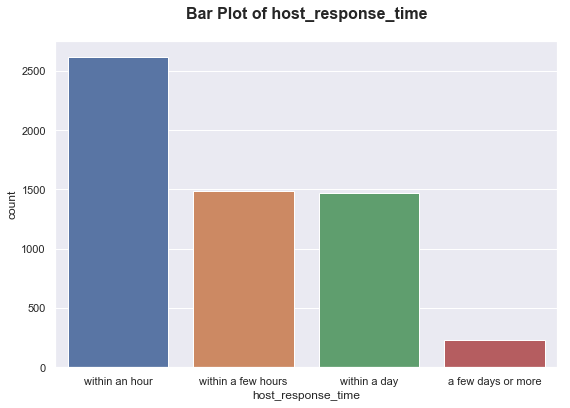

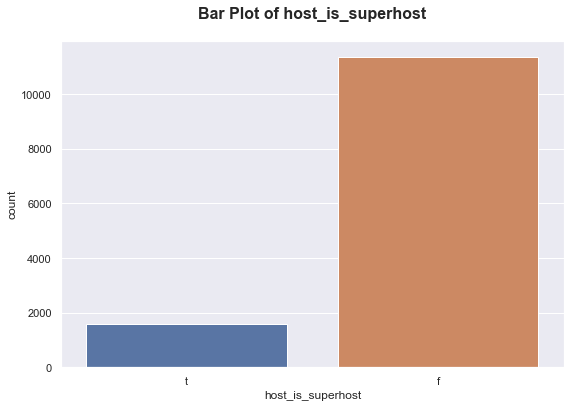

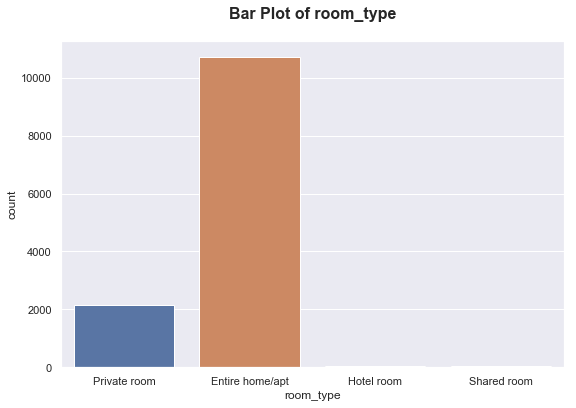

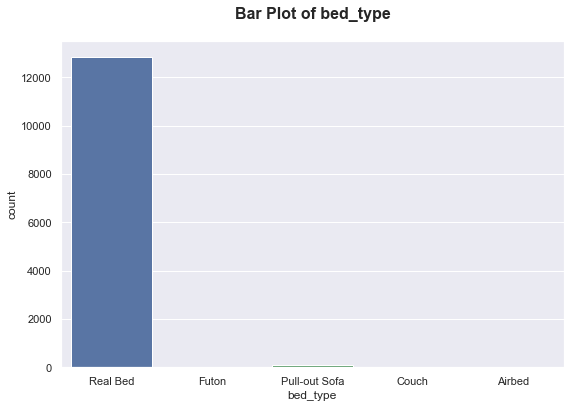

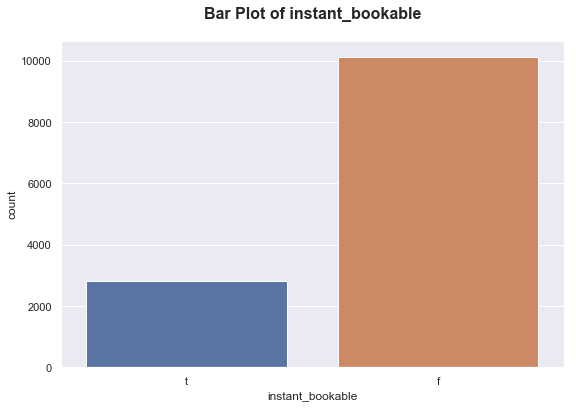

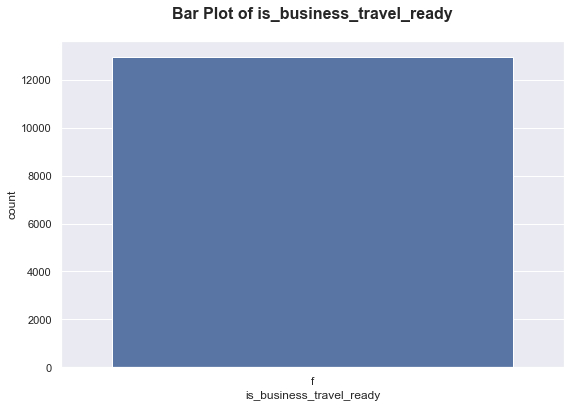

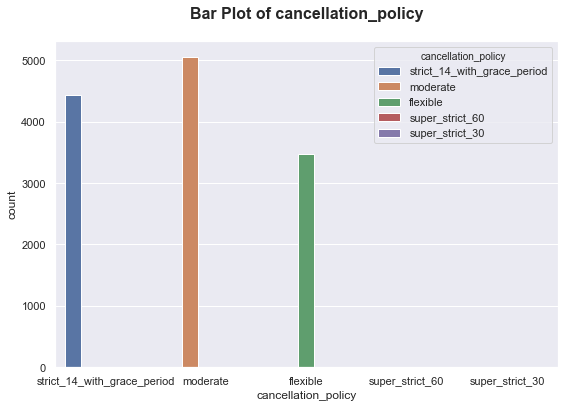

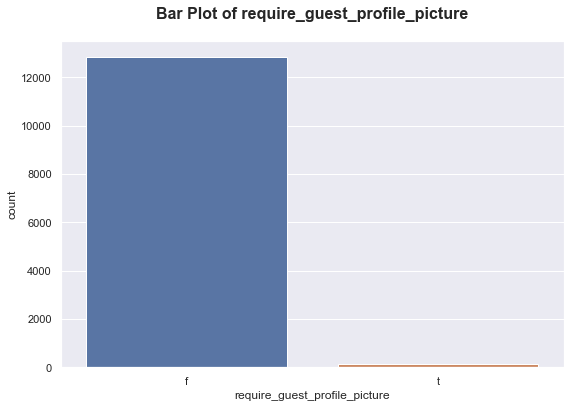

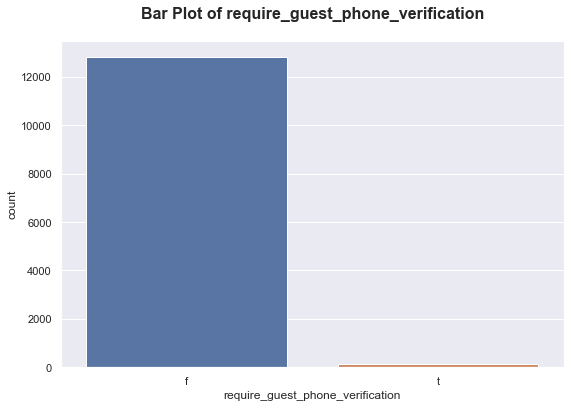

In [98]:
#
#bar_plot(df, style='plotly', var1='host_response_time', barmode=None) apparently, plotly is not good with nulls but seaborn is
bar_plot(df, style='seaborn', var1='host_response_time', barmode=None)
bar_plot(df, style='seaborn', var1='host_is_superhost', barmode=None)
bar_plot(df, style='seaborn', var1='room_type', barmode=None)
bar_plot(df, style='seaborn', var1='bed_type', barmode=None)
bar_plot(df, style='seaborn', var1='instant_bookable', barmode=None)
bar_plot(df, style='seaborn', var1='is_business_travel_ready', barmode=None)
bar_plot(df, style='seaborn', var1='cancellation_policy', barmode=None, hue='cancellation_policy')
bar_plot(df, style='seaborn', var1='require_guest_profile_picture', barmode=None)
bar_plot(df, style='seaborn', var1='require_guest_phone_verification', barmode=None)

### Property type category

Here, I am facing a dillema. Most listings are overwhelmingly apartments, which is normal, I guess, as we are looking at capitals. 
But terms like townhouse, house, guesthouse, cabin, villa, tiny house are all semantically just "house".
The same goes for apartment and condominium, serviced apartment, etc. 
This feature seems important but also perhaps too difficult to deal with. God knows how many categories we actually have in other data sets, that we don't find here, because none are 0, they're at least 1, which is suspicious. 

In [114]:
l = df.property_type.value_counts()
print(l.to_string())

Apartment                 10668
House                       839
Townhouse                   294
Condominium                 246
Loft                        223
Bed and breakfast           177
Houseboat                   163
Boat                        143
Guest suite                 104
Guesthouse                   26
Other                        20
Cabin                        10
Villa                         7
Aparthotel                    7
Serviced apartment            7
Tiny house                    6
Cottage                       6
Bungalow                      4
Hotel                         3
Camper/RV                     2
Yurt                          2
Chalet                        1
Dome house                    1
Earth house                   1
Casa particular (Cuba)        1
Barn                          1
Campsite                      1
Island                        1
Bus                           1
Boutique hotel                1


When creating a new listing on Airbnb, they ask you to first choose (to "narrow things down") between the following six categories:

Apartment, House, Secondaru Unit, Unique Space, Bed and Breakfast, Boutique Hotel

Then it goes into more detail, as such:

Apartment -> Apartment, condominium, casa particular, loft, serviced apartment. 
House -> House, bungalow, cabin, etc.

#### So, YES, my hypothesis was right. We CAN narrow it down, and we should also, theoretically, have access to the full range of possible options here.

So we can make each listing fit into one of six (or seven, if we have unknown of NaNs somehow, altough it should not be possible).

### Amenities

Special attention should be offered to the amenities feature, which has many categories and surely most of them are redundant; another idea would be to just measure the number of available amenities, so this is also debatable. 

In [15]:
df["amenities_counter"] = df.amenities.map(amenities_counter)

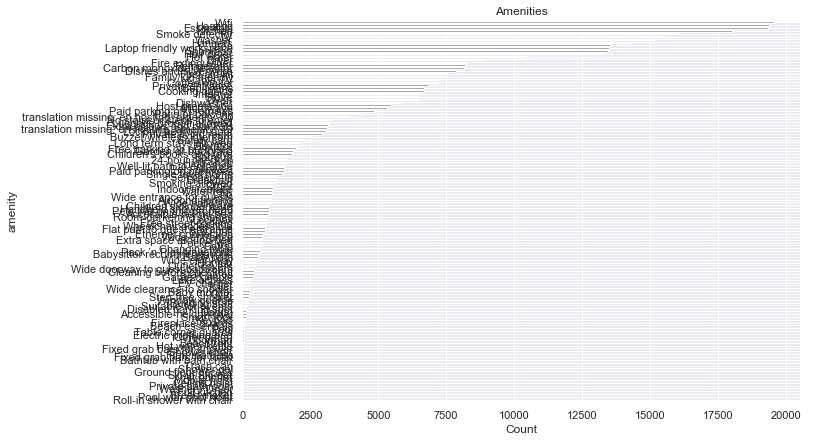

In [16]:
amenities = top_ammenities(df, plot=True)
top = amenities

In [17]:
top

[('Wifi', 19570),
 ('Heating', 19373),
 ('Essentials', 19351),
 ('Kitchen', 18035),
 ('Smoke detector', 16024),
 ('TV', 15468),
 ('Washer', 15143),
 ('Hangers', 14352),
 ('Iron', 13530),
 ('Laptop friendly workspace', 13503),
 ('Shampoo', 13477),
 ('Hair dryer', 13317),
 ('Hot water', 10427),
 ('Dryer', 8900),
 ('Fire extinguisher', 8228),
 ('Refrigerator', 8195),
 ('Carbon monoxide detector', 8164),
 ('Dishes and silverware', 7877),
 ('First aid kit', 7575),
 ('Family/kid friendly', 7397),
 ('Cable TV', 7230),
 ('Coffee maker', 7190),
 ('Private entrance', 6875),
 ('Bed linens', 6699),
 ('Cooking basics', 6697),
 ('Internet', 6517),
 ('Stove', 6505),
 ('Oven', 6467),
 ('Dishwasher', 5833),
 ('Host greets you', 5456),
 ('Microwave', 5312),
 ('Paid parking off premises', 4861),
 ('Patio or balcony', 4411),
 ('translation missing: en.hosting_amenity_50', 3926),
 ('No stairs or steps to enter', 3306),
 ('Luggage dropoff allowed', 3189),
 ('Extra pillows and blankets', 3165),
 ('translatio

#### Airbnb source 

As of today (27/02/2020) Airbnb groups amenities in 6 categories: Common (24), Additional (26), Family (17), Logistics (3), Home safety (4), Location (4) for a total of 78.

##### Obs: Here, in this dataset, we have much more, 130...

An idea would be to count how many of each category a listing has, or, better yet, what percentage of that particular category does it have covered. And then we just make 6 new features for each amenity type, with their respective values being the rates of ownership. 

#### I guess we could check a few more cities and see if the amenities lists correspond, and then we can do it by adding our own categories. Eg: pets. 

Obviously, the common ones are quite irrelevant, as they figure in most listings. Almost the same goes for Additional. Family is oriented towards children logistics and children safety. Home safety is a small niche with essentials like med kits, smoke alarms. Location is the category that's more poshy, as it has unique location perks such as beachfront, lake access, ski access, which could add up to the price.

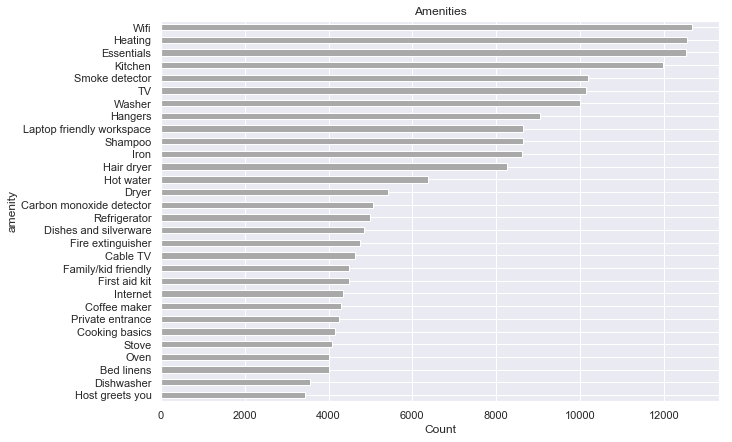

In [133]:
top_amenities = top_ammenities(df, top = 30, plot=True)

## 7) Encoding categorical features 


In [88]:
#
dummy_feature_list = ["host_response_time","cancellation_policy","host_verifications",
                     "room_type","bed_type",] 
for f in dummy_feature_list:
    dumm = make_dummy(df,f)
    df = pd.concat([df,dumm], axis=1)

Binary categorical variables can be encoded as 0 and 1 instead of true or false.

In [102]:
#
label_encoding_list = ["host_identity_verified","host_has_profile_pic","instant_bookable"]
for f in label_encoding_list:
    map_feature(df,f)

In [140]:
drop_or_keep_feature(df, .1, print_option=True)

id contain :% 0.0 KEEP.
summary contain :% 2.8000000000000003 KEEP.
space contain :% 28.4 DROP !!!
description contain :% 1.0 KEEP.
experiences_offered contain :% 0.0 KEEP.
neighborhood_overview contain :% 32.7 DROP !!!
notes contain :% 60.699999999999996 DROP !!!
transit contain :% 30.599999999999998 DROP !!!
access contain :% 45.0 DROP !!!
interaction contain :% 39.900000000000006 DROP !!!
house_rules contain :% 40.300000000000004 DROP !!!
host_id contain :% 0.0 KEEP.
host_since contain :% 1.0 KEEP.
host_about contain :% 46.300000000000004 DROP !!!
host_response_time contain :% 55.300000000000004 DROP !!!
host_response_rate contain :% 55.300000000000004 DROP !!!
host_acceptance_rate contain :% 100.0 DROP !!!
host_is_superhost contain :% 0.0 KEEP.
host_listings_count contain :% 1.0 KEEP.
host_total_listings_count contain :% 1.0 KEEP.
host_verifications contain :% 0.0 KEEP.
neighbourhood contain :% 3.1 KEEP.
city contain :% 0.0 KEEP.
country contain :% 0.0 KEEP.
latitude contain :% 0.0

(['id',
  'summary',
  'description',
  'experiences_offered',
  'host_id',
  'host_since',
  'host_is_superhost',
  'host_listings_count',
  'host_total_listings_count',
  'host_verifications',
  'neighbourhood',
  'city',
  'country',
  'latitude',
  'longitude',
  'property_type',
  'room_type',
  'accommodates',
  'bathrooms',
  'bedrooms',
  'beds',
  'bed_type',
  'amenities',
  'price',
  'weekly_price',
  'monthly_price',
  'security_deposit',
  'cleaning_fee',
  'guests_included',
  'extra_people',
  'minimum_nights',
  'maximum_nights',
  'calendar_updated',
  'number_of_reviews',
  'review_scores_rating',
  'review_scores_accuracy',
  'instant_bookable',
  'is_business_travel_ready',
  'cancellation_policy',
  'require_guest_profile_picture',
  'require_guest_phone_verification',
  'calculated_host_listings_count',
  'calculated_host_listings_count_entire_homes',
  'calculated_host_listings_count_private_rooms',
  'calculated_host_listings_count_shared_rooms',
  'distance_to

##### So after filling out missing values, we still have a few columns with issues. 

Host since (1%) -> uhm??? With host since, I think I should just create a new feature that measure their age (in years), relative to the time of scraping, and when there's missing values, that's just absolute zero, I guess. Or we could just drop it. It's 1% in this case and it probably will be around the same figure in other datasets.

Host response time -> Fill with 'no response'

Host acceptance rate -> Flat out drop it 

Neighbourhood -> We're not really that interested in this. If we want data viz, we have the small listings files

Beds 2% -> Replace with 0 

First review 11.3% -> But I don't think we need these, apart from dataviz purposes. We have the 'host since' to judge a host's age. 

last review 11.3% -> This is a date. How we replace this is beyond me. Idea: if it is in 2019, we might create a new binary feature called 'host_active'. If it's missing, it means it never got reviews, which means it's inactive, technically speaking, at least. The question is: is it worth the effort? What does this tell us? 

review_scores_cleanliness contain :% 12.5 DROP !!!
review_scores_checkin contain :% 12.5 DROP !!!
review_scores_communication contain :% 12.5 DROP !!!
review_scores_location contain :% 12.5 DROP !!!
review_scores_value contain :% 12.5 DROP !!!

Unlike accuracy and the general score, these all have missing values. Do we need them? Do we replace them with the average? Theoretically, they could tell us some information about the hosts in general, but it's kind of outside our score. Location and value were interesting features to describe the listing. But perhaps general review score should do. 

Reviws per month 11.3% -> As reviews per month had a value of at least 0.1, we can conclude that the missing values are actually zeros, meaning that these hosts never received any reviews. And it becomes even more evident when we see that the numbers coincide with the first and last reviews. This is interesting to see, as it means these are all new locations (or, sadly, just locations that have been added but never wit hthe intention of actually capitalizing on them; perhaps just for testing, curiosity, who knows). 


## Amenities lists

#### Common
Essentials,Kitchen,Air conditioning,Heating,Hair dryer,Hangers,Iron,Washer,Dryer,Hot water,TV,Cable TV,Indoor fireplace,Private entrance,Private living room,Lock on bedroom door,Shampoo,Shower gel,Bed linens,Extra pillows and blankets,Wifi,Ethernet connection,Pocket wifi,Laptop-friendly workspace


#### Additional
Microwave,Coffee maker,Refrigerator,Dishwasher,Dishes and silverware,Cooking basics,Oven,Stove,Bread maker,Baking sheet,Barbeque utensils,Trash can,Free parking on premises,Free street parking,Paid parking off premises,Paid parking on premises,EV charger,Gym,Pool,Hot tub,Single level home,BBQ grill,Patio or balcony,Garden or backyard,Breakfast,Beach essentials

#### Family
Baby bath,Baby monitor,Babysitter recommendations,Bathtub,Changing table,Children's books and toys,Children's dinnerware,Crib,Fireplace guards,Game console,High chair,Outlet covers,Pack'n Play/travel crib,Room-darkening shades,Stair gates,Table corner guards,Window guards

#### Logistics
Luggage dropoff allowed,Cleaning before checkout,Long term stays allowed

#### Home safety 
Fire extinguisher,Carbon monoxide alarm,Smoke alarm,First aid kit

#### Location 
Beachfront,Lake access,Ski-in/Ski-out,Waterfront

In [101]:
#
commonL = ['Essentials','Kitchen','Air conditioning','Heating','Hair dryer','Hangers','Iron','Washer','Dryer','Hot water',
          'TV','Cable TV','Indoor fireplace','Private entrance','Private living room','Lock on bedroom door','Shampoo',
          'Shower gel','Bed linens','Extra pillows and blankets','Wifi','Ethernet connection','Pocket wifi','Laptop-friendly workspace',
          'Internet','Laptop friendly workspace','Washer / Dryer',' toilet']

additionalL = ['Microwave','Coffee maker','Refrigerator','Dishwasher','Dishes and silverware','Cooking basics','Oven','Stove',
              'Bread maker','Baking sheet','Barbeque utensils','Trash can','Free parking on premises','Free street parking',
              'Paid parking off premises','Paid parking on premises','EV charger','Gym','Pool','Hot tub','Single level home',
              'BBQ grill','Patio or balcony','Garden or backyard','Breakfast','Beach essentials',
              'Handheld shower head','Lockbox','Hot water kettle','Firm mattress']

familyL = ['Baby bath','Baby monitor','Babysitter recommendations','Bathtub','Changing table',"Children's books and toys","Children's dinnerware",
          'Crib','Fireplace guards','Game console','High chair','Outlet covers',"Pack'n Play/travel crib",'Room-darkening shades',
          'Stair gates','Table corner guards','Window guards',
          'Family/kid friendly','Pack ’n Play/travel crib','Children’s books and toys','Children’s dinnerware']

logisticsL = ['Luggage dropoff allowed','Cleaning before checkout','Long term stays allowed',
             'Host greets you','24-hour check-in','Self check-in','Smoking allowed','Suitable for events']

homesafetyL = ['Fire extinguisher','Carbon monoxide alarm','Smoke alarm','First aid kit',
              'Smoke detector','Carbon monoxide detector','Accessible-height bed','Safety card',
              'Accessible-height toilet',]

locationL = ['Beachfront','Lake access','Ski-in/Ski-out','Waterfront']

petsL = ['Pets allowed','Cat(s)','Dog(s)','Pets live on this property']

accessL = ['Buzzer/wireless intercom','Smart lock','No stairs or steps to enter','Elevator','Well-lit path to entrance',
          'Buzzer/wireless intercom','Ground floor access','Flat path to guest entrance','Doorman',
          'Keypad']

specialneedsL = ['Step-free shower','Electric profiling bed','Wheelchair accessible','Disabled parking spot','Building staff']
    
spaciousL = ['Wide entrance for guests','Wide hallways','Wide entrance','Wide entryway','Extra space around bed',
            'Wide doorway to guest bathroom','Wide clearance to shower']

all_amenities = commonL + additionalL + familyL + logisticsL + homesafetyL + locationL + petsL + accessL + specialneedsL + spaciousL

### Making amenities into lists
These lambda functions will transform the data into a processable format.

#### Obs:
I had to make some groups of my own, as there were amenities not directly specified on Airbnb, but related to some other stuff, such as house rules, safety cards, details about the place, etc.

In [83]:
#
df["amenities"] = df["amenities"].apply(lambda x: x.replace('"', ''))
df["amenities"] = df["amenities"].apply(lambda x: x[1:-1].replace("\'", "").split(","))
ame = list(df.amenities)
ame

[['Internet',
  'Wifi',
  'Paid parking off premises',
  'Buzzer/wireless intercom',
  'Heating',
  'Washer',
  'Smoke detector',
  'Carbon monoxide detector',
  'First aid kit',
  'Safety card',
  'Fire extinguisher',
  'Essentials',
  'Shampoo',
  'Lock on bedroom door',
  '24-hour check-in',
  'Hangers',
  'Hair dryer',
  'Iron',
  'Laptop friendly workspace',
  'translation missing: en.hosting_amenity_49',
  'translation missing: en.hosting_amenity_50',
  'Private entrance',
  'Hot water',
  'Bed linens',
  'Extra pillows and blankets',
  'Single level home',
  'Garden or backyard',
  'No stairs or steps to enter',
  'Accessible-height bed',
  'Host greets you',
  'Handheld shower head',
  'Paid parking on premises'],
 ['TV',
  'Internet',
  'Wifi',
  'Paid parking off premises',
  'Heating',
  'Smoke detector',
  'Carbon monoxide detector',
  'Fire extinguisher',
  'Essentials',
  'Hangers',
  'Hair dryer',
  'Laptop friendly workspace',
  'translation missing: en.hosting_amenity_

### Encoding amenities into new features based on listing category
These functions will help us group up the amenities into new features. We can then count the number of features in each category (len(group)).

#### Obs: 
At the moment I couldn't find a way to generalize all of these functions into one.

In [102]:
# 
def common(row):
    out = []
    for amenity in row['amenities']:
        if amenity in commonL:
            out.append(amenity)
    return(out)
def additional(row):
    out = []
    for amenity in row['amenities']:
        if amenity in additionalL:
            out.append(amenity)
    return(out)
def family(row):
    out = []
    for amenity in row['amenities']:
        if amenity in familyL:
            out.append(amenity)
    return(out)
def logistics(row):
    out = []
    for amenity in row['amenities']:
        if amenity in logisticsL:
            out.append(amenity)
    return(out)
def homesafety(row):
    out = []
    for amenity in row['amenities']:
        if amenity in homesafetyL:
            out.append(amenity)
    return(out)
def location(row):
    out = []
    for amenity in row['amenities']:
        if amenity in locationL:
            out.append(amenity)
    return(out)
def pets(row):
    out = []
    for amenity in row['amenities']:
        if amenity in petsL:
            out.append(amenity)
    return(out)
def access(row):
    out = []
    for amenity in row['amenities']:
        if amenity in accessL:
            out.append(amenity)
    return(out)
def specialneeds(row):
    out = []
    for amenity in row['amenities']:
        if amenity in specialneedsL:
            out.append(amenity)
    return(out)
def spacious(row):
    out = []
    for amenity in row['amenities']:
        if amenity in spaciousL:
            out.append(amenity)
    return(out)
def other(row):
    out = []
    for amenity in row['amenities']:
        if amenity not in all_amenities:
            out.append(amenity)
    return(out)

Now we can drop the original amenities column plus the amenities_other column, which contains erros and inexplicit content.

In [103]:
#
df['amenities_common'] = df.apply(common, axis=1)
df['amenities_additional'] = df.apply(additional, axis=1)
df['amenities_family'] = df.apply(family, axis=1)
df['amenities_logistics'] = df.apply(logistics, axis=1)
df['amenities_safety'] = df.apply(homesafety, axis=1)
df['amenities_location'] = df.apply(location, axis=1)
df['amenities_pets'] = df.apply(pets, axis=1)
df['amenities_access'] = df.apply(access, axis=1)
df['amenities_special_needs'] = df.apply(specialneeds, axis=1)
df['amenities_spacious'] = df.apply(spacious, axis=1)
df['amenities_other'] = df.apply(other, axis=1)

In [106]:
df.drop(['amenities','amenities_other'], axis=1,inplace=True)

In [116]:
#
df['amenities_common'] = df['amenities_common'].map(amenities_list_counter)
df['amenities_additional'] = df['amenities_additional'].map(amenities_list_counter)
df['amenities_family'] = df['amenities_family'].map(amenities_list_counter)
df['amenities_logistics'] = df['amenities_logistics'].map(amenities_list_counter)
df['amenities_safety'] = df['amenities_safety'].map(amenities_list_counter)
df['amenities_location'] = df['amenities_location'].map(amenities_list_counter)
df['amenities_pets'] = df['amenities_pets'].map(amenities_list_counter)
df['amenities_access'] = df['amenities_access'].map(amenities_list_counter)
df['amenities_special_needs'] = df['amenities_special_needs'].map(amenities_list_counter)
df['amenities_spacious'] = df['amenities_spacious'].map(amenities_list_counter)

## Property Types

#### Apartment
Apartment, Condominium, Casa particular (Cuba), Loft, Serviced apartment

#### House
House, Bungalow, Cabin, Casa particular (Cuba), Chalet, Cottage, Cycladic house (Greece), Dammuso (Italy), Dome house, Earth house, Farm stay, Houseboat, Hut, Lighthouse, Pension (South Korea), Shepherd's hut (U.K.,France), Tiny house, Townhouse, Trullo (Italy)

#### Secondary unit
Guesthouse, Guest suite, Farm stay

#### Unique space
Barn, Boat, Bus, Camper/RV, Campsite, Castle, Cave, Dome house, Earth house, Farm stay, Houseboat, Hut, Igloo, Island, Lighthouse, Pension (South Korea), Plane, Shepherd's hut (U.K.,France), Tent, Tiny house, Tipi, Train, Treehouse, Windmill, Yurt

#### Bed and breakfast
Bed and breakfast, Casa particular (Cuba), Farm stay, Minsu (Taiwan), Nature lodge, Ryokan (Japan)

#### Boutique hotel
Boutique hotel, Aparthotel, Heritage hotel (India), Hostel, Hotel, Nature lodge, Resort, Serviced apartment, Kezhan (China)

### Obs!
##### Some types appear in several lists. These are: 

#### Other
Casa particular (Cuba) -> in Apartment, House, Bed and Breakfast
Serviced apartment -> in Apartment, Boutique hotel
Pension (South Korea) -> in House, Unique space
Tiny house -> in House, Unique space
Shepherd's hut -> in House, Unique space
Houseboat -> in House, Unique space 
Hut -> in House, Unique space
Farm stay -> in House, Secondary unit, Unique Space, Bed and breakfast 
Earth house -> in House, Unique space
Nature lodge -> in Bed and breakfast, Boutique hotel

In [317]:
#
apartmentL = ['Apartment', 'Condominium', 'Loft']

houseL = ['House', 'Bungalow', 'Cabin', 'Chalet, Cottage', 'Cycladic house (Greece)', 
         'Dammuso (Italy)', 'Dome house', 'Lighthouse', 'Townhouse', 'Trullo (Italy)']

secondaryL = ['Guesthouse', 'Guest suite']

uniqueL = ['Barn', 'Boat', 'Bus', 'Camper/RV', 'Campsite', 'Castle', 'Cave', 'Dome house',
          'Igloo', 'Island', 'Lighthouse', 'Plane', 'Tent', 'Tipi', 'Train', 'Treehouse', 'Windmill', 'Yurt']

bedbreakfastL = ['Bed and breakfast', 'Minsu (Taiwan)','Ryokan (Japan)']

hotelL = ['Boutique hotel', 'Aparthotel', 'Heritage hotel (India)', 'Hostel', 'Hotel',
         'Resort', 'Kezhan (China)']

ambiguousL = ['Casa particular (Cuba)', 'Serviced apartment', 'Pension (South Korea)','Tiny house',"Shepherd's hut (U.K.,France)",
        'Houseboat','Hut','Farm stay','Earth house']

all_listing_types = apartmentL + houseL + secondaryL + uniqueL + bedbreakfastL + hotelL + ambiguousL

In [318]:
assign_property_type_group()

In [319]:
df.property_type_groups.isna().sum()

83

In [320]:
fill_nans(df,"property_type_groups","other")

In [321]:
df.property_type_groups.isna().sum()

0

In [325]:
dummy = make_dummy(df,"property_type_groups")

In [327]:
# Join the encoded dummy
df = df.join(dummy)
# Drop the initial series
df.drop(["property_type","property_type_groups"], axis=1,inplace=True)

## Text to text length 
For predicting the price using listings.csv, we're only going to be interested in the number of words in any text type of feature.

In [225]:
#
text_features_list = ['name','summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes',
                        'transit', 'access', 'interaction', 'house_rules', 'host_about']

for f in text_features_list:
    fill_nans(df,f,"")
    
for f in text_features_list:
    df[f] = df[f].str.split().str.len()

## Calculating host 'age'

In [236]:
host_age(df,2020)

## Occupancy rate

A certain listing might be more popular than others. There is currently no official way of determining exactly how many actual bookings a listing has received. But perhaps I can derive an appoximation of that number from the number of total reviews or reviews per month it has. Also, perhaps the reviews per month might be sufficient to tell the story in this case.


#### Example
Not all guests that stay with a host leave them a review. We need to make an educated guess of how many stays actually receive feedback, on average. According to the Occupancy Rate/San Francisco model proposed on InsideAirbnb, this rate could be anywhere from 30% to 70%. Taking an average of these, a cautious rate of 50% can be used. Meaning that, for a particular listing, out of 10 guests, only 5 will leave a review on average. Meaning that, if we know a listing has x reviews, we can deduct that, in reality, its occupancy was around 10.

## Normalization of prices

In [244]:
#
normalization_list = ['price','security_deposit','cleaning_fee','extra_people']

for n in normalization_list:
    normalize_price(df,n)

KeyboardInterrupt: 